---
title: "Re-assembly Starting Communities"
author: "Afra Salazar and Sara Mitri"
date: "March 2025"

jupyter: julia

format:
  html:
    self-contained: true
    fig-dpi: 400
    theme: cosmo
    fontsize: 1.1rem
    linestretch: 1.4
    linkcolor: "#82a6b3"
    mainfont: "Source Sans Pro"
    highlight-style: github
    code-fold: true
    code-summary: "Show the code"

toc: true
---


In [1]:
#| code-summary: "Loading necessary libraries and packages"

using Gadfly, Distributions, DataFrames, JLD2, Cairo, Fontconfig, CSV, Dates, LinearAlgebra, Colors, Statistics, JSON3, Distances, CategoricalArrays

In [2]:
#| code-summary: "Custom functions"

function generateCommunities(ϕ, α, τ, σ) #Generates communities given certain size, sizes are given in the vector α.

    METACommunity = []
    for αi in α #[2, 3, 4, 5...]
        combinationsαi = 0
        
        while combinationsαi < σ
            #Sample a random community of size αi
            comSampled = sample(speciesnames, αi, replace = false)
            
            #Ensure that there are no trophic levels (τ) missing in the community.
            if length(findall(x -> x == 0, [sum(ϕ[!, comSampled][i, :]) for i in 1:τ])) == 0 
                a = length(METACommunity)
                push!(METACommunity, comSampled)
                b = length(unique(sort.(METACommunity))) 
                
                a == b ? 0 : combinationsαi += 1 #If the community did not exist before in the metacommunity, add it to the number of combinations
                
            end
            
        end

    end
    
    return unique(sort.(METACommunity))
end


function sortMetaCommunity!(METACommunity)
    sizes = []
    for m in METACommunity
        push!(sizes, length(m))
    end

    METACommunity_SizeSorted = sort(DataFrame(hcat(METACommunity, sizes), ["Community", "Size"]), "Size")
    METACommunity = METACommunity_SizeSorted[!, :Community]
end


function getDATAFRAME(data, dname, coln)
    DICT = Dict()
    DICT["iso_index"] = string.(data[!, :iso_index])
    #DICT["iso_index"] = string.(data[!, :Genome])

    for name in dname
        zerovector = zeros(Int, l)
        xx = zerovector[findall(x -> x == name, data[!, coln])] .= 1
        DICT[name] = xx.parent
    end

    dataframe = DataFrame(DICT)
        
    dataframe_collapsed = combine(groupby(dataframe, :iso_index), dname .=> sum)
    dataframe_collapsed[!,:iso_index] = convert.(String, dataframe_collapsed[!, :iso_index])
    
    sumnames = names(dataframe_collapsed) #Combining groups added novel column names with the suffix "sum". I am here extracting such names. 
    
    for sumname in sumnames[2:length(sumnames)] # All colapsed sum, whenever larger than zero, is set equal to 1.
        rep = findall(x -> x > 0, dataframe_collapsed[!, sumname])
        dataframe_collapsed[rep, sumname] .= 1
    end
    
    dataframe_collapsed_perm = permutedims(dataframe_collapsed, "iso_index")
    
    return dataframe_collapsed_perm

end


function removeDiagonal(a)
    i = CartesianIndices(a)
    n = size(a, 1)
    k = filter(x -> x.I[1] != x.I[2], i)
    b = reshape(a'[k], n - 1, n)'
    return(b)
end


function getCoverage(MCommunity, td)
    M = []

    for μ in MCommunity
        this_commmunity_coverage = []
        
        for s in μ
            this_species_coverage = findall(x -> x > 0, td[!, s]) 
            push!(this_commmunity_coverage, this_species_coverage...)
        end
    
        push!(M, this_commmunity_coverage)
    end
    
    return length.(unique.(M))    
end

#Measure community complementarity using the consumption and production profiles
function communityComplementarity(mC, mP)
    intersectionCom = []
    S = size(mC, 1)

    for δi_consumption in eachrow(mC)
        intersectionSi = []
    
        for δj in 1:S
            δj_production = mP[δj, :]
            δj_consumption = mC[δj, :]
        
            a = δi_consumption .+ δj_production
            b = length(findall(==(2), a)) / sum(δi_consumption)

            push!(intersectionSi, b)
        end
        push!(intersectionCom, intersectionSi)
    end
    
    a = hcat(intersectionCom...)'
    b = removeDiagonal(a)
    
    return b
    
end


#Get community complementarity of each community in the METACommunity
function getComplementarity(METACommunity, ϕS, ϕP)
    mC = []
    mP = []

    for μ in METACommunity   #Access to the community array, each μ is an array of strings
        δC_community = []
        δP_community = []
        
        for s in μ           #Access to each string (microbe name) of the community μ
            δC_species = ϕS[!, s] 
            δP_species = ϕP[!, s] 
            push!(δC_community, δC_species)
            push!(δP_community, δP_species)
        end
    
        push!(mC, δC_community)
        push!(mP, δP_community)
    end
    
    δC_Metacommunity = []

    for m in mC 
        push!(δC_Metacommunity, hcat(m...)')
    end 
    
    δP_Metacommunity = []
    
    for m in mP 
        push!(δP_Metacommunity, hcat(m...)')
    end 
    
    complementarities = []
    
    for c in 1:length(δC_Metacommunity)
        this_comm_complementarity = communityComplementarity(δC_Metacommunity[c], δP_Metacommunity[c])
        push!(complementarities, this_comm_complementarity)
    end
    
    return complementarities
    
end


function getCompetition(METACommunity, substrates)
    M = []

    for μ in METACommunity
        δC_community = []
        
        for s in μ
            δC_species = substrates[!, s] 
            push!(δC_community, δC_species)
        end
    
        push!(M, δC_community)
    end

    δC_Metacommunity = []

    for m in M 
        push!(δC_Metacommunity, hcat(m...)')
    end 
    
    competitionIndex = []
    
    for mConsumption in δC_Metacommunity
        intersectionCom = []

        for δi_consumption in eachrow(mConsumption)
            intersectionSi = []
    
            for δj_consumption in eachrow(mConsumption)
                a = δi_consumption .+ δj_consumption
                b = length(findall(==(2), a)) / sum(δi_consumption)

                push!(intersectionSi, b)
            end
            push!(intersectionCom, intersectionSi)
        end
    
        a = hcat(intersectionCom...)'
        b = removeDiagonal(a)
        
        push!(competitionIndex, b)
        
    end
    
    return competitionIndex
end

#expandDataFrame splits the rows in the product column of the original dataframe into several rows according to the separator "+"
function expandDataFrame(DF, column, dnames) 
    names = setdiff(dnames, column)
    
    result_df = DataFrame()
    for row in eachrow(DF)
        split_elements = split(row["$(column)"], "+") #Split rule
        temp_df = DataFrame("$(column)" => split_elements)
    
        for col in names
            temp_df[!, col] = repeat([row[col]], length(split_elements))
        end
    
        result_df = vcat(result_df, temp_df)
    end
    
    return result_df
    
end

function expandDataFrameProducts(DF) 
    
    result_df = DataFrame()
    for row in eachrow(DF)
        split_elements = split(row["Product"], " + ") #Split rule
        temp_df = DataFrame("Product" => split_elements)
    
        for col in ["Gene", "Genome", "Gene_Count", "Path", "Activity", "Trophic_level", "Substrate", "Enzymatic_Activity", "iso_index"]
            temp_df[!, col] = repeat([row[col]], length(split_elements))
        end
    
        result_df = vcat(result_df, temp_df)
    end
    
    return result_df
    
end

function expandDataFrameSubstrates(DF) 
    
    result_df = DataFrame()
    for row in eachrow(DF)
        split_elements = split(row["Substrate"], " + ") #Split rule
        temp_df = DataFrame("Substrate" => split_elements)
    
        for col in ["Gene", "Genome", "Gene_Count", "Path", "Activity", "Trophic_level", "Product", "Enzymatic_Activity", "iso_index"]
            temp_df[!, col] = repeat([row[col]], length(split_elements))
        end
    
        result_df = vcat(result_df, temp_df)
    end
    
    return result_df
    
end

#Sample communities that simultaneously maximise the spread along ψ, pathway coverage and community richness
function sampleCommunities(a, b, c, k::Int)
    N = length(a) #Number of communities
    data = hcat(a, b, c) #Combine community traits in a matrix

    meanpoint = vec(mean(data, dims = 1)) #Compute mean individual in trait space and flatten it to a vector

    #Pick the first individual furthest from the mean
    findividual = pairwise(Euclidean(), meanpoint, data')[:, 1]  #Fix distance computation
    findex = argmax(findividual)  #Most distant point from mean
    sindices = [findex]

    #Iteratively select individuals that maximize the minimum distance
    while length(sindices) < k
        rindices = setdiff(1:N, sindices) #Remaining indices / candidates
        
        #Compute minimum distance to any selected point
        mdistances = [minimum(euclidean(data[i, :], data[j, :]) for j in sindices) for i in rindices]

        nextindex = rindices[argmax(mdistances)]  #Get index of most distant candidate
        push!(sindices, nextindex)
    end

    return sindices  # Return selected indices
end

function exportMetacommunity(METACommunity, METACommunityPool, ψ, pathcoverage, round)
    a = nrow(METACommunityPool) + 1
    b = nrow(METACommunityPool) + length(METACommunity)
    ρ = repeat([round], length(METACommunity))
    
    ExportDF = DataFrame(CommunityID = ["com$(i)" for i in a:b], Members = METACommunity, MotherID = ["com$(i)" for i in ρ], FunIntegration = ψ, Coverage = pathcoverage, CommunityScore = fill(missing, length(METACommunity)), Round = ρ)
    
    timenow = Dates.format(now(), "yyyy.mm.dd")
    CSV.write("$(timenow)_METACommunity_Round-$(round).csv", ExportDF) ;
end


;

## PART I: Community assembly

This notebook imports the isolate trophic data from the enrichment experiments, rearranging them in several data frames bearing information in a long format. These data frames are then used to generate strain combinations (communities) according to desired criteria. The communities are analysed, obtaining information on their size, coverage and degree of functional integration. Such information is then used to sample communities that maximise variation across the three axes.

The final output of this notebook is a 'METACommunity' CSV file that contains all of the sampled communities and their information, as well as an empty column for their scores. 

## 1. [Read and manipulate isolates files ]{style="color: #001C60;"} 

In [3]:
#| code-summary: "Read isolate trophic data CSV file"
filepath = "IsolateTrophicData_20250516.csv" #isolate_growth_trophic_data_2024_05.csv
filedata = CSV.read(filepath, DataFrame) #Read CSV file at filepath
a = expandDataFrameProducts(filedata) #Separate products (e.g. pentose + hexose is made in two different entries/rows)
trophicdata = expandDataFrameSubstrates(a); #Separate substrates

In [4]:
#| code-summary: "Get information such as pathway and microbe names, IDs..."

speciesnames = string.(unique(trophicdata[!, :iso_index]))
#speciesnames = string.(unique(trophicdata[!, :Genome]))
ϕlevelsnames = unique(trophicdata[!, :Trophic_level])
pathnames = unique(trophicdata[!, :Activity])
substratenames = unique(trophicdata[!, :Substrate]) #20 substrates 
productnames = unique(trophicdata[!, :Product]) #13 products 
prodandsubsnames = unique(vcat(unique(trophicdata[!, :Substrate]), unique(trophicdata[!, :Product]))) #26 elements
produced_metacommunity = intersect(substratenames, productnames) #Six products that can be 'cross-fed'
l = length(trophicdata.Genome)

τ = 5 ;  #Trophic levels 

In [5]:
mapIndextoGenome = Dict(string(row.iso_index) => row.Genome for row in eachrow(trophicdata))
speciesnames_genomes = [mapIndextoGenome[s] for s in speciesnames] ;

In [6]:
#| code-summary: "Create a binary dataframe on three levels: trophic levels, pathways, substrates and products"

ϕ_levels_collapsed_perm = getDATAFRAME(trophicdata, ϕlevelsnames, "Trophic_level")
paths_collapsed_perm = getDATAFRAME(trophicdata, pathnames, "Activity")
substrates_collapsed_perm = getDATAFRAME(trophicdata, prodandsubsnames, "Substrate");
products_collapsed_perm = getDATAFRAME(trophicdata, prodandsubsnames, "Product"); 
binarydataframes = [paths_collapsed_perm, substrates_collapsed_perm, products_collapsed_perm] ;
#I use prodandsubsnames rather than productnames and substratenames because complementarity requires they have the same length

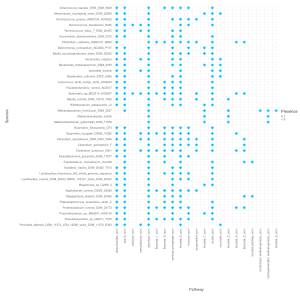

In [7]:
#| code-summary: "Plot pathway presence per Genome"

set_default_plot_size(30cm, 30cm)

#Columns containing species (exclude Row and iso_index)
species_cols = sort(names(paths_collapsed_perm)[2:end], rev = true)

# Convert wide to long format
long_df = stack(paths_collapsed_perm, species_cols)

# Rename for clarity
rename!(long_df, :variable => :Species, :value => :Presence)
long_df.Genomes = [mapIndextoGenome[s] for s in long_df.Species] 

# Plot
PathwayIsolates = plot(long_df,
    x=:iso_index,
    y=:Genomes,
    color = :Presence,
    size = :Presence,
    Geom.point,
    shape = [Shape.diamond],
    Scale.color_discrete(),
    Guide.xlabel("Pathway"),
    Guide.ylabel("Species"),
    Theme(point_size = 3pt)
)

#draw(PDF("PathwayIsolates.pdf", 30cm, 30cm), PathwayIsolates)

## 2. [Community assembly and analysis ]{style="color: #001C60;"} 

In [8]:
#| code-summary: "Assembly of communities"

N = 25 #Combinations per size
α = collect(5:1:(length(speciesnames) - 1)) #Vector of sizes

METACommunity = []
METACommunity = generateCommunities(ϕ_levels_collapsed_perm, α, τ, N) 
allmemberscommunity = string.(unique(trophicdata[!, :iso_index])) 
push!(METACommunity, allmemberscommunity) #Add the community of all members in the METACommunity
sortMetaCommunity!(METACommunity) ;

In [9]:
#| code-summary: "Get Coverage, Complementarity and Competition at the metabolite level"

pathcoverage = getCoverage(METACommunity, paths_collapsed_perm)
competition = getCompetition(METACommunity, substrates_collapsed_perm)
complementarity = getComplementarity(METACommunity, substrates_collapsed_perm, products_collapsed_perm)
ψ = mean.(complementarity) .* (1 .- mean.(competition)) ;

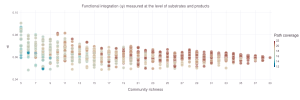

In [10]:
#| code-summary: "Plot communities"
set_default_plot_size(30cm, 10cm)

maxsize = maximum(length.(METACommunity))
minsize = minimum(length.(METACommunity)) 

maxcovg = maximum(pathcoverage)
mincovg = minimum(pathcoverage)

ψplot = plot(x = length.(METACommunity), y = ψ, Geom.point, color = pathcoverage,
    alpha = [0.8], size = [1.5mm], Theme(highlight_width = 0.5pt, continuous_highlight_color = u -> "white"), 
    Guide.yticks(ticks = collect(0.04:0.02:0.1)),
    Guide.xticks(ticks=collect(minsize:2:maxsize)),
    Guide.colorkey(title = "Path coverage"),
    Guide.title("Functional integration (ψ) measured at the level of substrates and products"),
    Guide.xlabel("Community richness"),
    Guide.ylabel("ψ"))

## 3. [Sampling METACommunity]{style="color: #001C60;"} 

In [11]:
#| code-summary: "Sample metacommunity maximising variance at Functional integration (ψ), Pathway Coverage and Community Size"

N = length(METACommunity)  #Total number of MetaCommunities
k = 63   #Communities to sample

sampledCommunities = sampleCommunities(ψ, pathcoverage, length.(METACommunity), k) #Sample communities
nonsampled = setdiff(1:length(METACommunity), sampledCommunities) #Non-sampled communities
sMETA = METACommunity[sampledCommunities] #Extract isolate identities from the METACommunity
sampledMETACommunity = [parse.(Int, sMETA[i]) for i in 1:k] ; #Convert identity names to Int for robot input

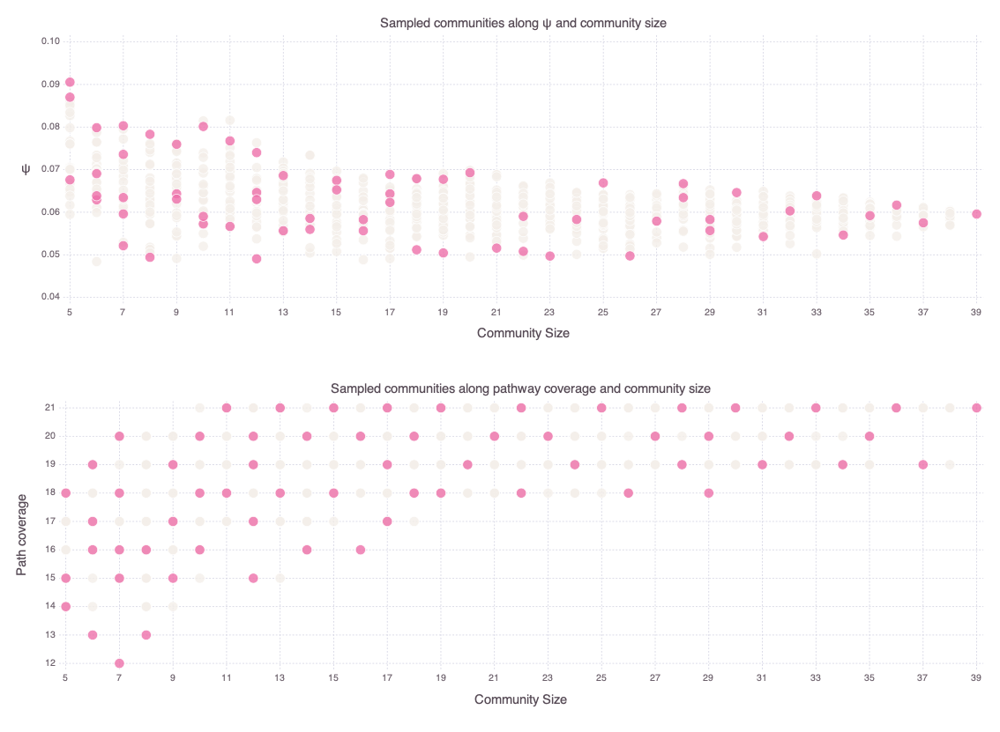

In [12]:
#| code-summary: "Plot sampled communities"
set_default_plot_size(30cm, 22cm)

ψsampledplot = plot(layer(x = length.(METACommunity)[sampledCommunities], y = ψ[sampledCommunities], Geom.point, color = [colorant"#ED71AA"],
    alpha = [0.8], size = [1.5mm], Theme(highlight_width = 0.5pt, continuous_highlight_color = u -> "white")),
    layer(x = length.(METACommunity)[nonsampled], y = ψ[nonsampled], Geom.point, color = [colorant"#F3EEE9"],
    alpha = [0.8], size = [1.5mm], Theme(highlight_width = 0.5pt, continuous_highlight_color = u -> "white")),
    
    Guide.xticks(ticks=collect(minsize:2:maxsize)),
    Guide.colorkey(title = " "),
    Guide.title("Sampled communities along ψ and community size"),
    Guide.xlabel("Community Size"),
    Guide.ylabel("ψ"))

pathcovsampledplot = plot(
    layer(x = length.(METACommunity)[sampledCommunities], y = pathcoverage[sampledCommunities], 
        Geom.point, color = [colorant"#ED71AA"], alpha = [0.8], size = [1.5mm], 
        Theme(highlight_width = 0.5pt, continuous_highlight_color = u -> "white")),
        
    layer(x = length.(METACommunity)[nonsampled], y = pathcoverage[nonsampled], Geom.point,
        color = [colorant"#F3EEE9"],
        alpha = [0.8], size = [1.5mm], 
        Theme(highlight_width = 0.5pt, continuous_highlight_color = u -> "white")),
    
    Guide.xticks(ticks=collect(minsize:2:maxsize)),
    Guide.yticks((ticks=collect(minimum(pathcoverage):1:maximum(pathcoverage)))),
    Guide.colorkey(title = " "),
    Guide.title("Sampled communities along pathway coverage and community size"),
    Guide.xlabel("Community Size"),
    Guide.ylabel("Path coverage"))

vstack(ψsampledplot, pathcovsampledplot)

In [13]:
#draw(PDF("SelectedCommunitiesR0.pdf", 30cm, 25cm), vstack(ψsampledplot, pathcovsampledplot))

## 4. [Export sampled METACommunity]{style="color: #001C60;"} 

In [14]:
#| code-summary: "File export"

METACommunityPool = DataFrame()

#Exporting sampled communities
exportMetacommunity(sampledMETACommunity, METACommunityPool, ψ[sampledCommunities], pathcoverage[sampledCommunities], 0)

#Exporting METACommunityPool
CSV.write("METACommunityPool.csv", METACommunityPool) ;